<a href="https://colab.research.google.com/github/Mirabelljoicelaura/PCVK/blob/main/Week11/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


KELOMPOK 8

Nama Anggota Kelompok :

1. Mirabell Joice Laura (2141720174)
2. M. Edwin Isa Alfais (2141720193)
3. Nabilah Amaalina Syafa (2141720198)

1. Buka https://colab.research.google.com/. Setelah dipastikan bahwa google Colab
terhubung dengan Github Anda, buat notebook baru dan beri nama “Week11.ipynb”.
Kemudian import beberapa library dan akses folder yang ada di Drive Anda dengan
cara sebagai berikut.

Object Detection

Metode yang digunakan :

Template Matching

Edge Detection

Corner Detection

Grid Detection

Contour Detection

In [46]:
#import library yang dibutuhkan
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [47]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2. Implementasikan 6 metode template matching pada OpenCV dengan menggunakan
gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

##Template Matching


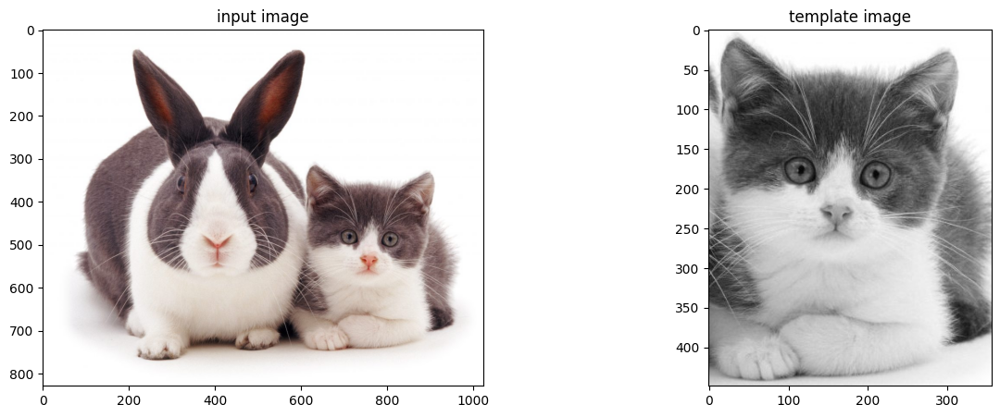

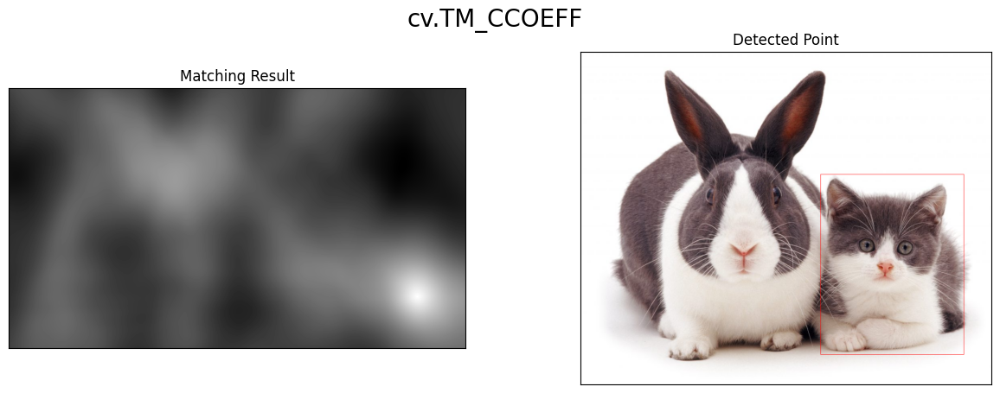

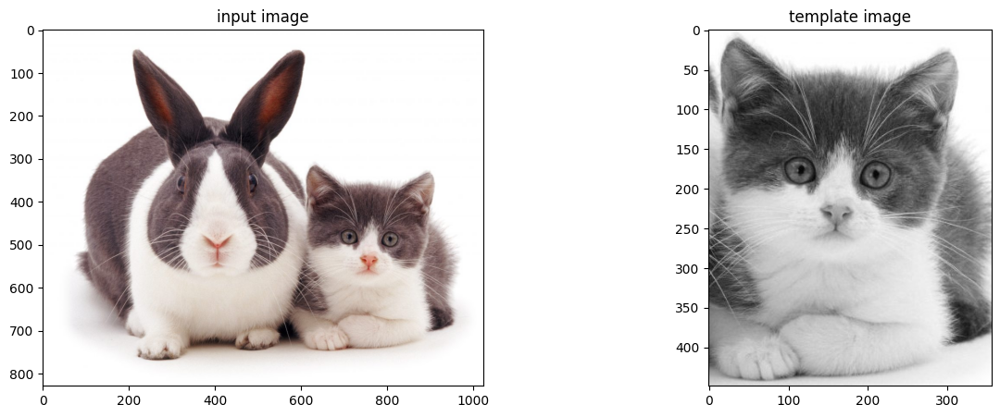

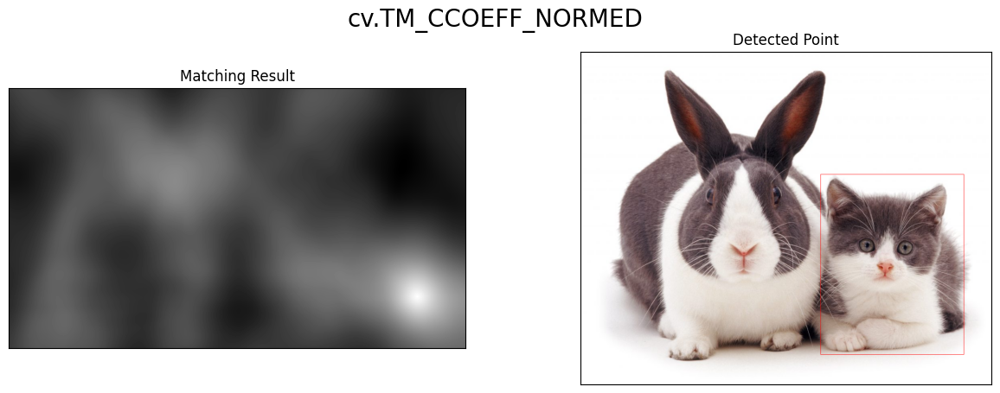

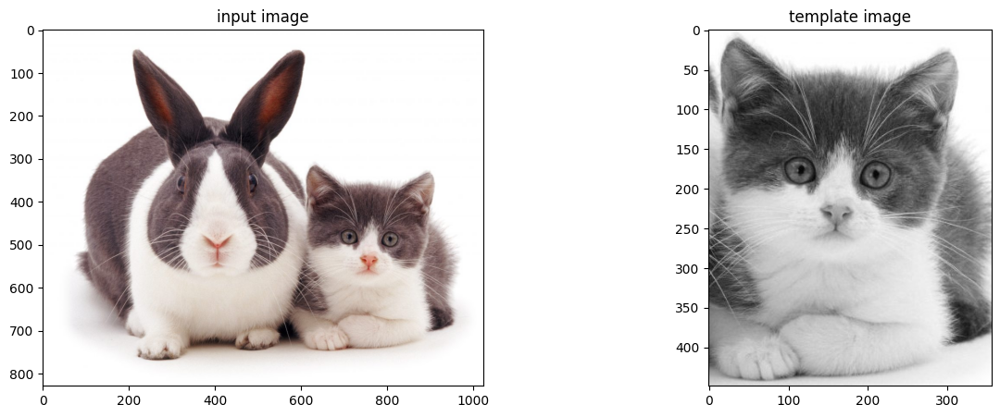

...

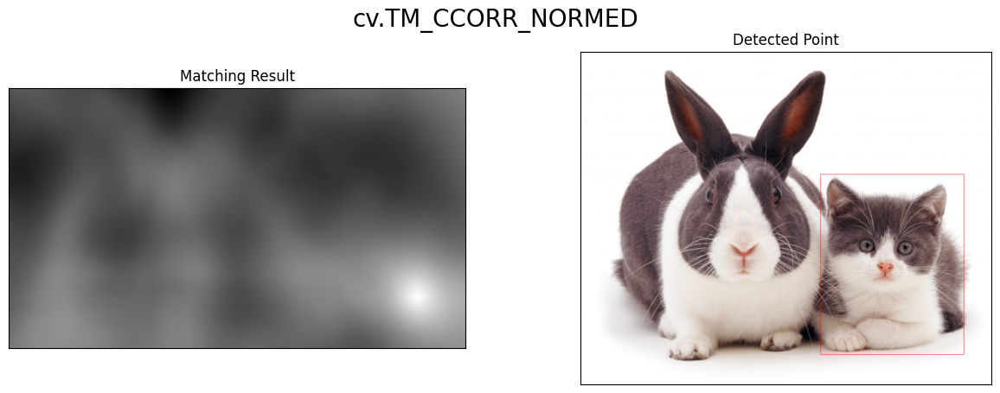

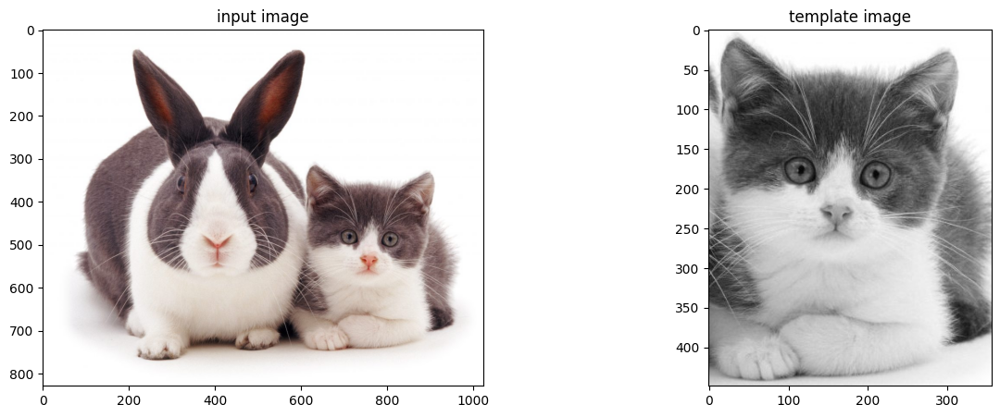

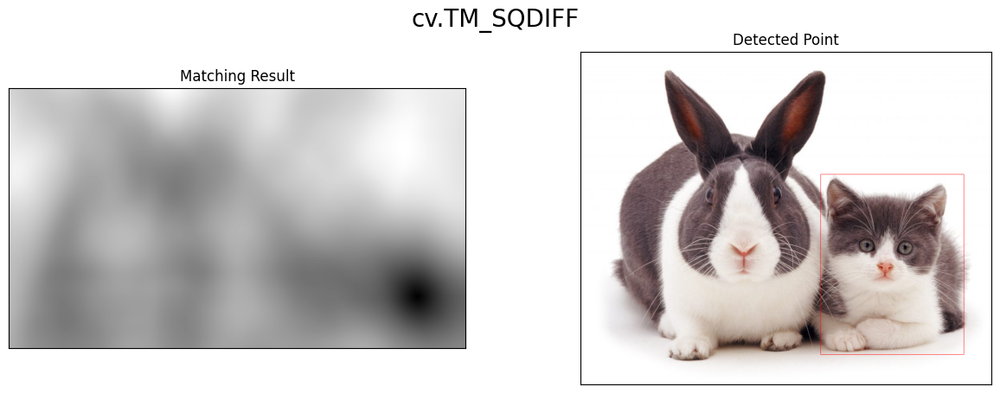

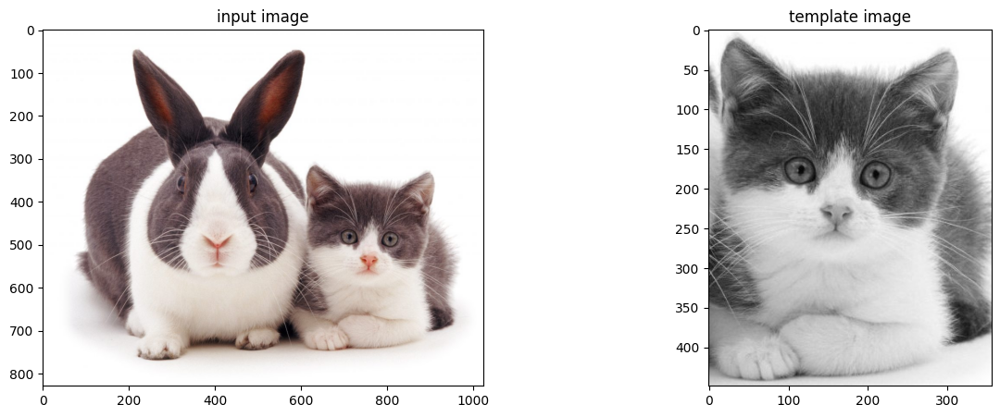

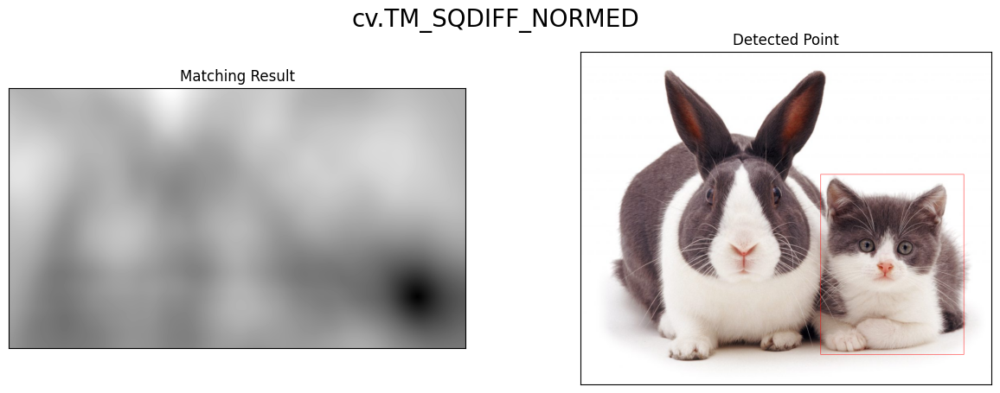

In [48]:
def template_matching(img, template, method):
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img_copy = img.copy()
    w, h = template.shape[::-1]

     # print input image dan template
    f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
    axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
    axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

    res = cv.matchTemplate(img_gray, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)


    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img_copy, top_left, bottom_right, (0, 0, 255))

    return img_copy, res

img = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/cats_and_bunnies.jpg')
template = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/cat2_templatejpg.jpg', 0)

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
           'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for method_str in methods:
    method = eval(method_str)
    result_img, result_res = template_matching(img, template, method)

    plt.figure(figsize=(15, 5))
    plt.subplot(121), plt.imshow(result_res, cmap='gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(cv.cvtColor(result_img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(method_str, fontsize=20)
    plt.show()


3. Implementasikan konsep template matching tanpa menggunakan library OpenCV
untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan
bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai
berikut:

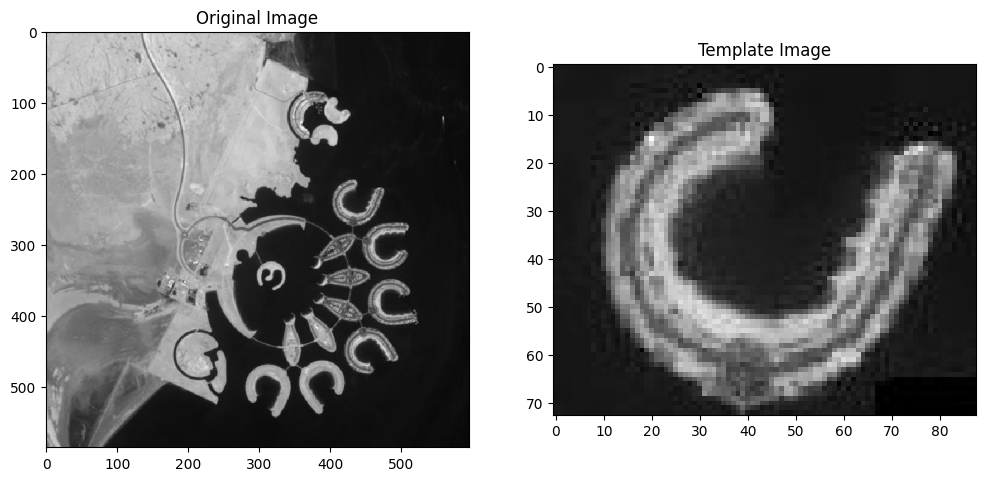

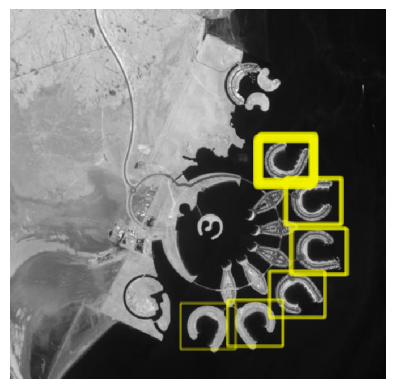

In [49]:
from skimage.feature import match_template

image = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/bahrain.jpg', 0)
template_image = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/bahrain-template.jpg', 0)

fig, axarr = plt.subplots(1, 2, figsize=(12, 8))
axarr[0].imshow(image, cmap='gray')
axarr[0].set_title("Original Image")
axarr[1].imshow(template_image, cmap='gray')
axarr[1].set_title("Template Image")

# Hitung kemiripan citra dengan citra template
result = match_template(image, template_image)

# Tentukan threshold untuk hasil match
threshold = 0.45
locations = np.where(result >= threshold)

# Plot hasil match
fig, ax = plt.subplots()
ax.imshow(image, cmap=plt.cm.gray)
ax.set_axis_off()
height, width = template_image.shape
for loc in zip(*locations[::-1]):
    rect = plt.Rectangle(loc, width, height, edgecolor='yellow', facecolor='none', linewidth=0.1)
    ax.add_patch(rect)

plt.show()

4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian
Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga
menghasilkan luaran sebagai berikut:

##a. Sobel Edge Detection

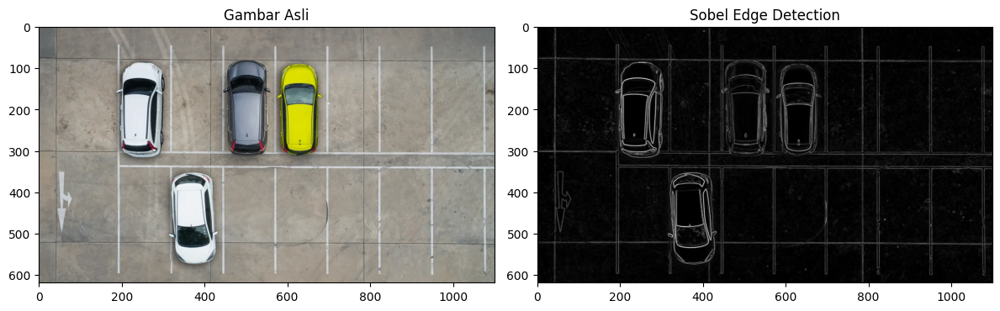

In [50]:
image= cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/car-park.jpg')

img_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

img_car = cv.cvtColor(image, cv.COLOR_BGR2RGB)


# Sobel Edge Detection
sobel_x = cv.Sobel(img_gray, cv.CV_64F, 1, 0, ksize=3)
sobel_y = cv.Sobel(img_gray, cv.CV_64F, 0, 1, ksize=3)
sobel_combined = cv.magnitude(sobel_x, sobel_y)

# Tampilkan gambar asli dan hasil deteksi tepi
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.imshow(img_car, cmap='gray')
plt.title('Gambar Asli')

plt.subplot(2, 2, 2)
plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Edge Detection')

plt.tight_layout()
plt.show()

##b. Canny Edge Detection


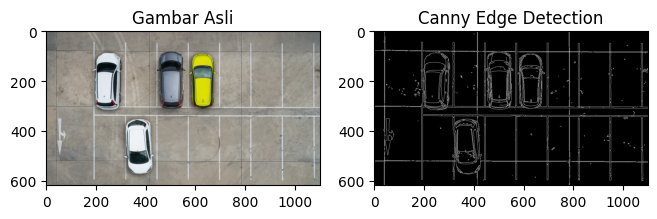

In [51]:
# Tampilkan gambar-gambar hasil
plt.figure(figsize=(12, 5))

plt.subplot(131)
plt.imshow(img_car, cmap='gray')
plt.title('Gambar Asli')

# Canny Edge Detection
canny = cv.Canny(image, 100, 200)


plt.subplot(132)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edge Detection')

plt.show();

##c. Laplacian Edge Detection

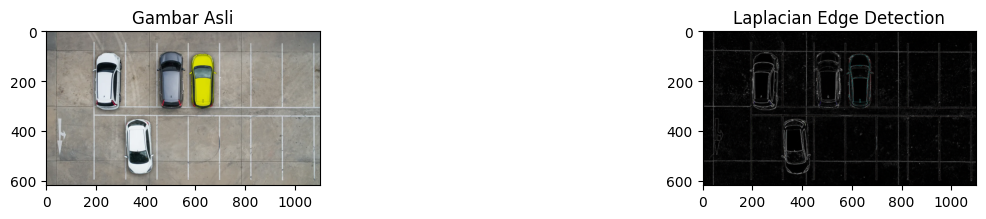

In [52]:
# Tampilkan gambar-gambar hasil
plt.figure(figsize=(12, 5))

plt.subplot(131)
plt.imshow(img_car, cmap='gray')
plt.title('Gambar Asli')

# Laplacian Edge Detection
laplacian = cv.Laplacian(image, cv.CV_64F)
laplacian_abs = cv.convertScaleAbs(laplacian)

plt.subplot(133)
plt.imshow(laplacian_abs, cmap='gray')
plt.title('Laplacian Edge Detection')

plt.show()

5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada
OpenCV dengan menggunakan gambar chess-board.jpg, sehingga menghasilkan
luaran sebagai berikut:

##a. Harris Corner Detection


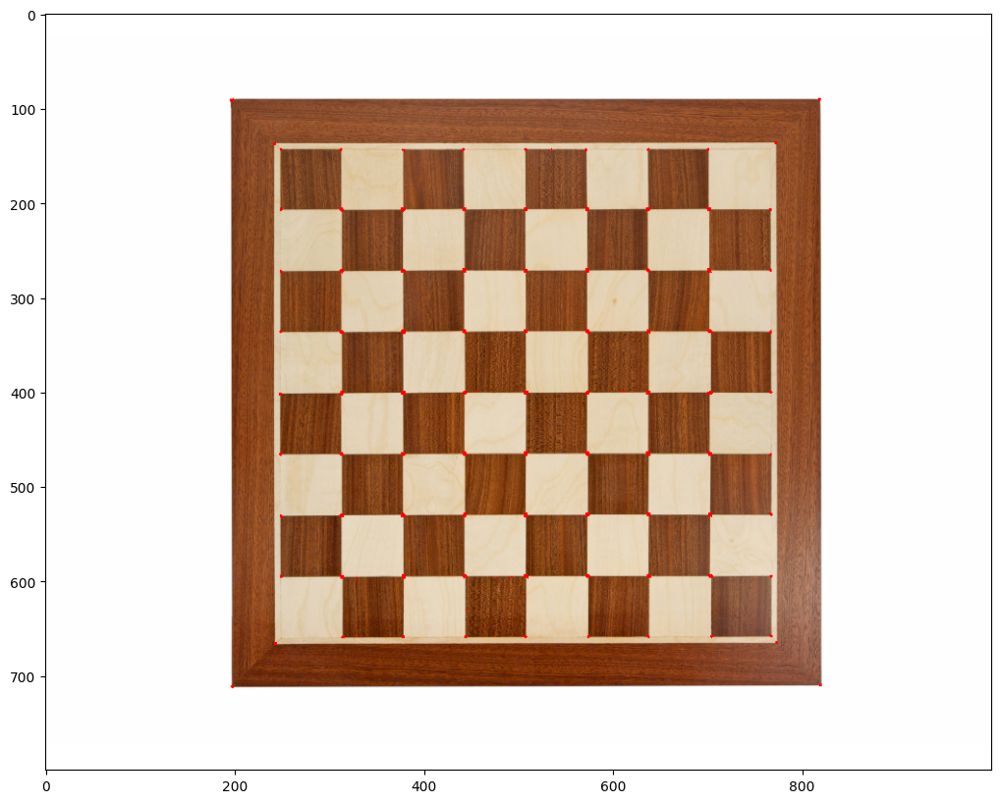

In [53]:
#load citra input
input_img = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img,3,1,0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3, 3)
#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

#Threshold untuk mengoptimalkan nilai
input_img[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

##b. Shi-Tomasi Detection

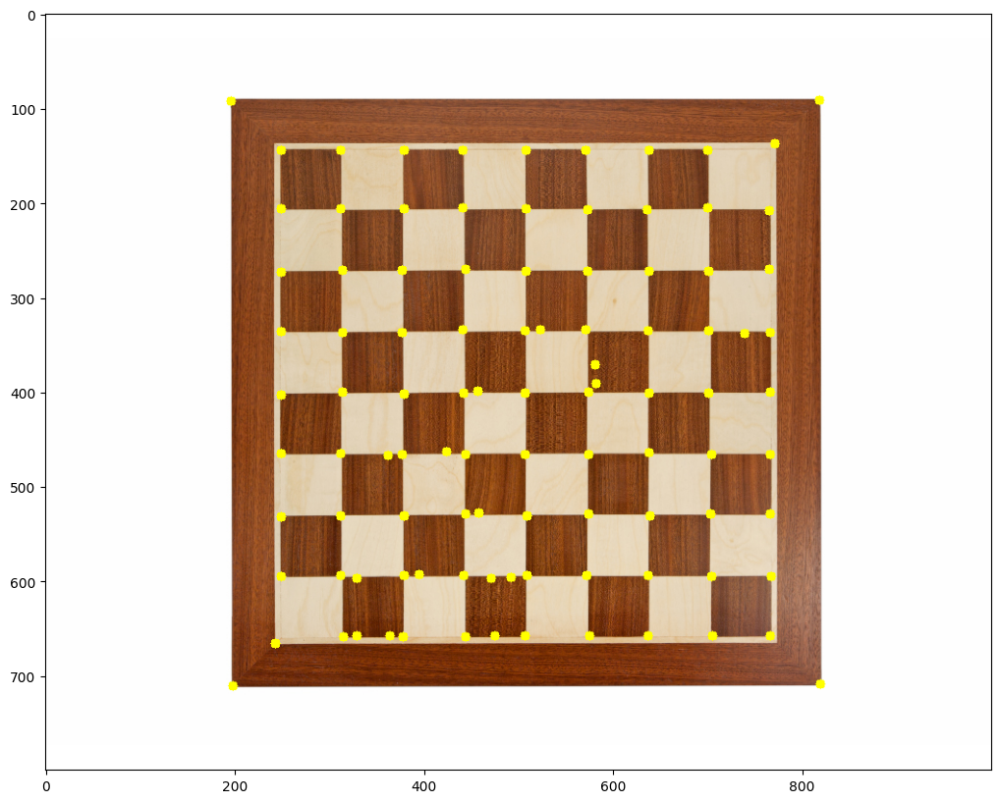

In [54]:
# Load citra input
input_img = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

# Deteksi sudut menggunakan Shi-Tomasi Detection
corners = cv.goodFeaturesToTrack(gray_img, maxCorners=100, qualityLevel=0.01, minDistance=10)

# Konversi koordinat sudut menjadi integer
corners = np.int0(corners)

# Tandai sudut dengan warna kuning
for corner in corners:
    x, y = corner.ravel()
    cv.circle(input_img, (x, y), 5, (0, 255, 255), -1)

plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
plt.show()


6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan
gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan
teori, sehingga menghasilkan luaran sebagai berikut:

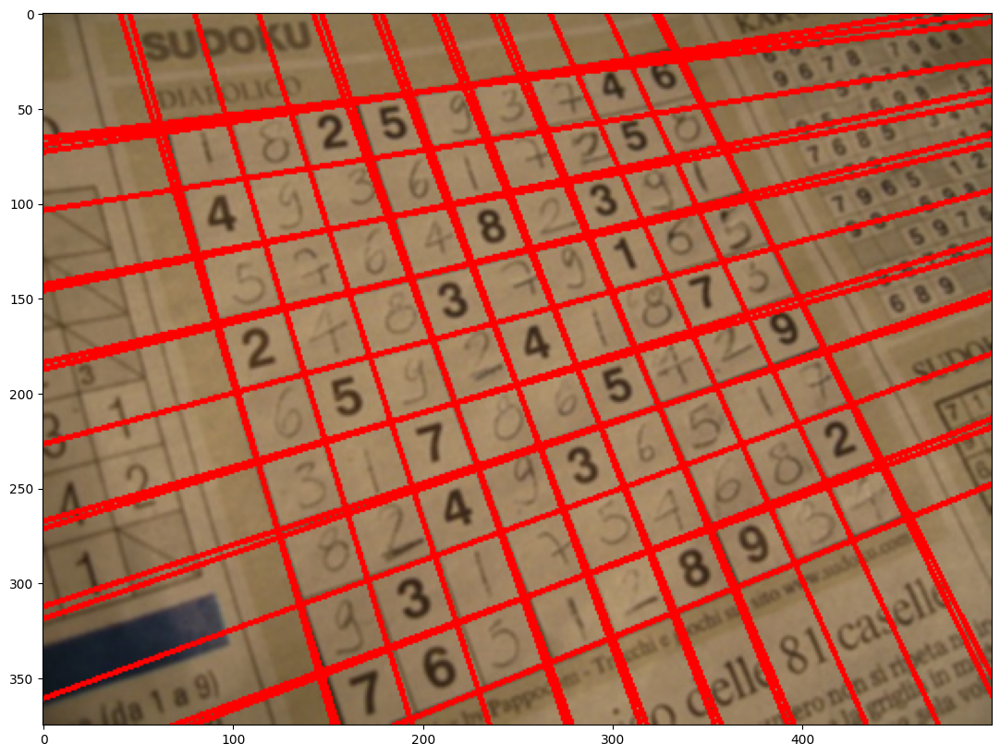

In [55]:
# Baca gambar
image = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/sudoku.jpg')
img_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Deteksi tepi dengan Canny
edges = cv.Canny(img_gray, 90, 150, apertureSize=3)

# Operasi dilasi
kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)

# Operasi erosi
kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

# Deteksi garis dengan Hough Line Transform
lines = cv.HoughLines(edges, 1, np.pi / 180, 150)

if not lines is None and len(lines) > 0:
    for line in lines:
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        cv.line(image, (x1, y1), (x2, y2), (0, 0, 255), 2)

    plt.figure(figsize=(20, 10))
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.show()
else:
    print('No lines were found')

7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan
menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:

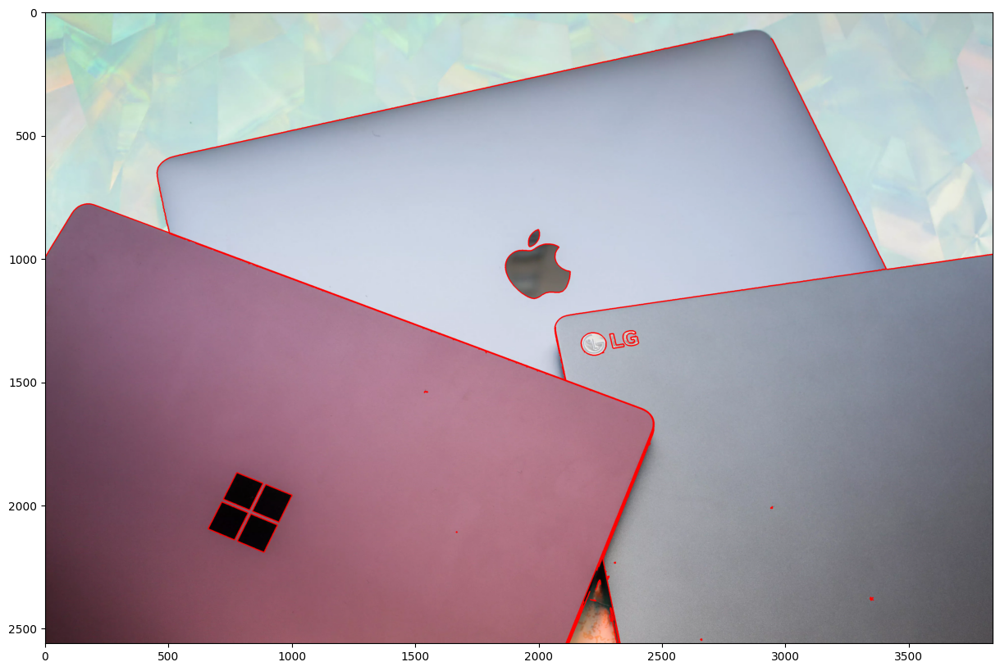

In [56]:
img = cv.imread('/content/drive/MyDrive/PCVK/Dataset/Object Detection/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

E. Pengayaan Materi KTP



1. Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban


2. Muat 2 library berikut sebagai tahapan persiapan

In [57]:
import cv2
import os

3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori
dataset tersebut


In [58]:
# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/KTP_More"

# Nama file yang ingin di proses
name_file = "ktp3.png"

# Looping file di direktori
if name_file in os.listdir(path_plate):
    image_path = os.path.join(path_plate, name_file)
    src = cv2.imread(os.path.join(path_plate, name_file))
    blurred = src.copy()
    gray = blurred.copy()

4. Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle
dapat direduksi

In [59]:
# Filtering
for i in range(10):
  blurred = cv2.GaussianBlur(src, (5, 5), 0.5)


5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan
binerisasi citra


168.0 (300, 493)


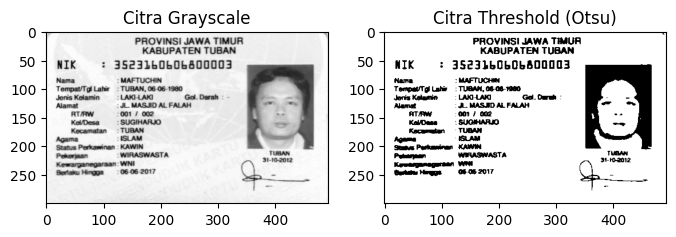

In [60]:
import matplotlib.pyplot as plt
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY
+ cv2.THRESH_OTSU)
print(ret, bw.shape)

plt.figure(figsize=(8, 8))
plt.subplot(121)
plt.imshow(gray, cmap='gray')
plt.title('Citra Grayscale')

plt.subplot(122)
plt.imshow(bw, cmap='gray')
plt.title('Citra Threshold (Otsu)')

plt.show()


6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter
atau obyek tidak berhimpitan.


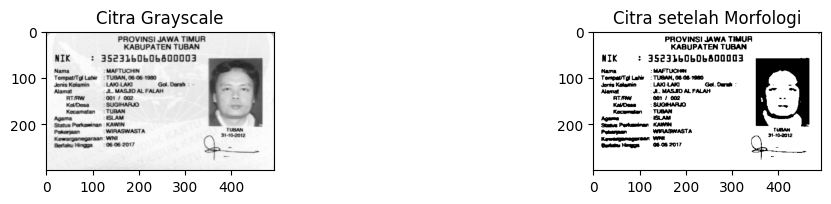

In [61]:
# Operasi morfologi
kernel = np.ones((1, 1), np.uint8)
eroded_image = cv2.erode(bw, kernel, iterations=1)

# Tampilkan citra hasil morfologi
plt.figure(figsize=(10, 6))
plt.subplot(131)
plt.imshow(gray, cmap='gray')
plt.title('Citra Grayscale')

plt.subplot(133)
plt.imshow(eroded_image, cmap='gray')
plt.title('Citra setelah Morfologi')

plt.show()

7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di
dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran
dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain
terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik
(karena hasil akuisisi setiap citra dapat berbeda).

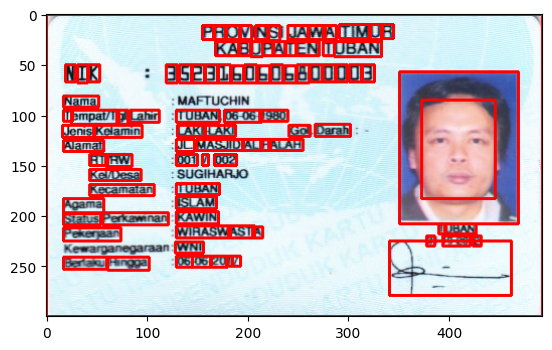

In [67]:
import matplotlib.pyplot as plt

# Load the image
image_path = os.path.join(path_plate, name_file)
image = cv2.imread(image_path)

# Ekstraksi kontur
contours, hierarchy = cv2.findContours(eroded_image.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 6 and float(ras) <= 6:
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 15 and w >= 6 and float(ras) <= 7:
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

# Menampilkan gambar image dengan kontur menggunakan plt
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()


##Tugas Praktikum

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP
untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing
yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah. Pengerjaan dilakukan
secara berkelompok dengan aturan sebagai berikut:
Kelompok 8 – KTP Galang Raka Bengkulu

88.0 (338, 600)


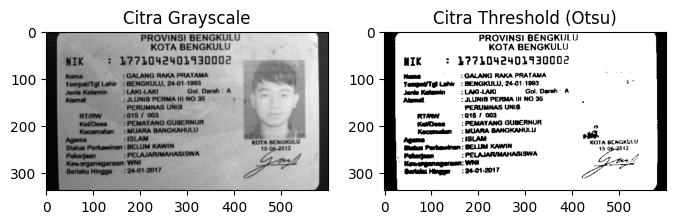

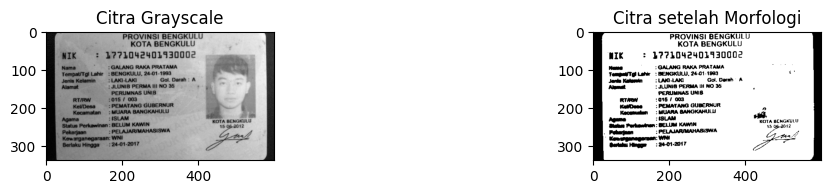

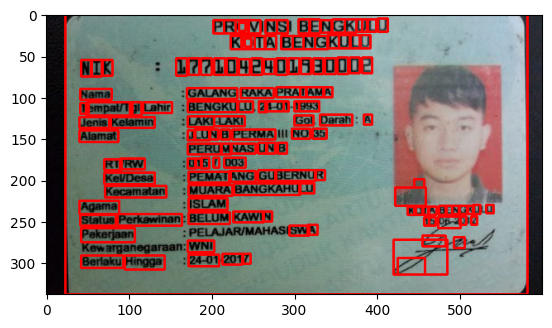

In [70]:
import cv2
import os
import matplotlib.pyplot as plt

# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/KTP_More"

# Nama file yang ingin di proses
name_file = "ktp1.png"

# Looping file di direktori
if name_file in os.listdir(path_plate):
    image_path = os.path.join(path_plate, name_file)
    src = cv2.imread(os.path.join(path_plate, name_file))
    blurred = src.copy()
    gray = blurred.copy()

# Filtering
for i in range(10):
  blurred = cv2.GaussianBlur(src, (5, 5), 0.5)
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY
+ cv2.THRESH_OTSU)
print(ret, bw.shape)

plt.figure(figsize=(8, 8))
plt.subplot(121)
plt.imshow(gray, cmap='gray')
plt.title('Citra Grayscale')

plt.subplot(122)
plt.imshow(bw, cmap='gray')
plt.title('Citra Threshold (Otsu)')

plt.show()

# Operasi morfologi
kernel = np.ones((1, 1), np.uint8)
eroded_image = cv2.erode(bw, kernel, iterations=1)

# Tampilkan citra hasil morfologi
plt.figure(figsize=(10, 6))
plt.subplot(131)
plt.imshow(gray, cmap='gray')
plt.title('Citra Grayscale')

plt.subplot(133)
plt.imshow(eroded_image, cmap='gray')
plt.title('Citra setelah Morfologi')

plt.show()

# Load the image
image_path = os.path.join(path_plate, name_file)
image = cv2.imread(image_path)

# Ekstraksi kontur
contours, hierarchy = cv2.findContours(eroded_image.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
   x, y, w, h = cv2.boundingRect(cnt)
   ras = format(w / h, '.2f')
   if h >= 40 and w >= 10 and float(ras) <= 1:
      cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
   elif h >= 10 and w >= 6 and float(ras) <= 6:
      cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
   elif h >= 15 and w >= 6 and float(ras) <= 7:
          cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

  # Menampilkan gambar image dengan kontur menggunakan plt
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()